# Fine Tuning using LoRA - Tutorial

In [1]:
# Make necessary imports
import os
import json
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from diffusers import StableDiffusionPipeline, UNet2DConditionModel, DDPMScheduler, AutoencoderKL
from transformers import CLIPTextModel, CLIPTokenizer

In [2]:
def setup_device():
    """
    Automatically detect and setup the best available device(s)
    Returns device and whether multiple GPUs are available
    """
    
    if torch.cuda.is_available():
        num_gpus = torch.cuda.device_count()
        device = torch.device('cuda:0')
        
        print(f"GPU acceleration enabled!")
        print(f"   Available GPUs: {num_gpus}")
        for i in range(num_gpus):
            gpu_name = torch.cuda.get_device_name(i)
            gpu_memory = torch.cuda.get_device_properties(i).total_memory / 1e9
            print(f"   GPU {i}: {gpu_name} ({gpu_memory:.1f}GB)") 
        multi_gpu = num_gpus > 1
        if multi_gpu:
            print(f"Multi-GPU training will be used ({num_gpus} GPUs)")
        return device, multi_gpu
    else:
        print("No GPU detected, using CPU")
        return torch.device('cpu'), False

In [3]:
# LoRA Implementation
class LoRALayer(torch.nn.Module):
    def __init__(self, original_layer, rank=16, alpha=32):
        super().__init__()
        self.original_layer = original_layer
        self.rank = rank
        self.alpha = alpha
        
        # Get dtype and device from original layer
        if hasattr(original_layer, 'weight'):
            dtype = original_layer.weight.dtype
            device = original_layer.weight.device
        else:
            dtype = torch.float32
            device = torch.device('cpu')
        
        # Freeze original weights
        for param in self.original_layer.parameters():
            param.requires_grad = False
            
        # LoRA matrices: W = W0 + (alpha/rank) * B * A
        if hasattr(original_layer, 'in_features'):
            # Linear layer
            # Initialize A with Kaiming uniform (equivalent to Gaussian for ReLU networks)
            self.lora_A = torch.nn.Parameter(
                torch.nn.init.kaiming_uniform_(
                    torch.empty(rank, original_layer.in_features, dtype=dtype, device=device),
                    a=np.sqrt(5)
                )
            )
            # Initialize B with zeros
            self.lora_B = torch.nn.Parameter(
                torch.zeros(original_layer.out_features, rank, dtype=dtype, device=device)
            )
        elif hasattr(original_layer, 'in_channels'):
            
            # Conv2D layer
            out_channels = original_layer.out_channels
            in_channels = original_layer.in_channels
            kernel_size = original_layer.kernel_size[0] * original_layer.kernel_size[1]
            
            # Reshape Conv2D to 2D for LoRA decomposition
            # Weight shape: (out_channels, in_channels * kernel_size)
            self.lora_A = torch.nn.Parameter(
                torch.nn.init.kaiming_uniform_(
                    torch.empty(rank, in_channels * kernel_size, dtype=dtype, device=device),
                    a=np.sqrt(5)
                )
            )
            self.lora_B = torch.nn.Parameter(
                torch.zeros(out_channels, rank, dtype=dtype, device=device)
            )
    
    def forward(self, x):
        original_out = self.original_layer(x)
        
        if hasattr(self.original_layer, 'in_features'):
            # Linear layer LoRA
            # BA forms the low-rank update
            lora_out = F.linear(x, (self.alpha / self.rank) * (self.lora_B @ self.lora_A))
        else:
            # Conv2D layer LoRA - reshape approach
            # Compute low-rank weight update
            weight_update = (self.alpha / self.rank) * (self.lora_B @ self.lora_A)
            # Reshape back to conv weight shape
            out_channels = self.original_layer.out_channels
            in_channels = self.original_layer.in_channels
            kh, kw = self.original_layer.kernel_size
            
            weight_update = weight_update.view(out_channels, in_channels, kh, kw)
            
            lora_out = F.conv2d(x, weight_update, 
                              stride=self.original_layer.stride, 
                              padding=self.original_layer.padding)
        
        return original_out + lora_out

In [4]:
# Apply LoRA layer by layer
def apply_lora_to_unet(unet, rank=16, alpha=32, target_modules=None):
    """Apply LoRA to specific modules in UNet"""
    if target_modules is None:
        target_modules = [
            "to_k", "to_q", "to_v", "to_out.0",  # Cross-attention (text-to-image)
            "ff.net.0", "ff.net.2",              # Feed-forward (feature processing)
            "attn1.to_q", "attn1.to_v"           # Self-attention (spatial flower structure)
        ]
    
    lora_layers = {}
    
    def replace_layer(module, name=""):
        for child_name, child in module.named_children():
            layer_name = f"{name}.{child_name}" if name else child_name
            
            # Check if this layer should be replaced
            if any(target in layer_name for target in target_modules):
                if isinstance(child, (torch.nn.Linear, torch.nn.Conv2d)):
                    lora_layer = LoRALayer(child, rank, alpha)
                    setattr(module, child_name, lora_layer)
                    lora_layers[layer_name] = lora_layer
            else:
                replace_layer(child, layer_name)
    
    replace_layer(unet)
    return lora_layers

In [5]:
# Dataset Preparation
class MiniFlowerDataset(Dataset):
    def __init__(self, data_dir, cat_to_name_path, split='train', transform=None):
        """
        Dataset for flower images
        
        Args:
            data_dir: Path to data directory (e.g., './data/flower/dataset/')
            cat_to_name_path: Path to category mapping JSON
            split: 'train', 'val', or 'test'
            transform: Optional transforms to apply
        """
        self.data_dir = Path(data_dir)
        self.transform = transform
        # Load category mappings (folder_name -> plant_name)
        with open(cat_to_name_path, 'r') as f:
            self.cat_to_name = json.load(f)
        
        # Diverse caption templates for better training
        self.caption_templates = [
            "a beautiful {flower} flower",
            "close-up photograph of {flower}",
            "{flower} in full bloom",
            "vibrant {flower} petals",
            "detailed macro shot of {flower}",
            "{flower} flower photography",
            "stunning {flower} blossom",
            "colorful {flower} in garden",
            "{flower} flower head",
            "elegant {flower} bloom"
        ]
        
        # Style modifiers for additional variety
        self.style_modifiers = ["professional ", "artistic ", "macro ", "botanical "]
        
        # Collect file paths and labels
        self.samples = []
        split_path = self.data_dir / split
        
        for file_path in sorted(split_path.glob('*/*.*')):
            category_id = file_path.parent.name  # This is the folder name
            if category_id in self.cat_to_name:
                label_name = self.cat_to_name[category_id]
                self.samples.append((str(file_path), label_name))
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        file_path, label_name = self.samples[idx]
        
        # Load image
        image = Image.open(file_path).convert('RGB')
        
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        
        # Generate diverse caption from the plant name
        caption = np.random.choice(self.caption_templates).format(flower=label_name)
        
        # Add style variations (20% chance)
        if np.random.random() < 0.2:
            style = np.random.choice(self.style_modifiers)
            caption = style + caption
        
        return image, caption
    
    def __getitems__(self, indices):
        """Handle batch fetching for multiprocessing"""
        return [self.__getitem__(idx) for idx in indices]

In [6]:
# Training Setup
def setup_training():
    """Initialize models and components"""
    device, multi_gpu = setup_device()
    
    dtype = torch.float32
    
    # Load pre-trained SD1.5
    model_id = "runwayml/stable-diffusion-v1-5"
    
    # Load components separately for fine-tuning
    unet = UNet2DConditionModel.from_pretrained(model_id, subfolder="unet", torch_dtype=dtype)
    tokenizer = CLIPTokenizer.from_pretrained(model_id, subfolder="tokenizer")
    text_encoder = CLIPTextModel.from_pretrained(model_id, subfolder="text_encoder", torch_dtype=dtype)
    scheduler = DDPMScheduler.from_pretrained(model_id, subfolder="scheduler")
    vae = AutoencoderKL.from_pretrained(model_id, subfolder="vae", torch_dtype=dtype)
    
    # Freeze text encoder and VAE (keep them intact)
    text_encoder.requires_grad_(False)
    vae.requires_grad_(False)
    
    # Apply LoRA to UNet
    lora_layers = apply_lora_to_unet(unet, rank=16, alpha=32)
    
    # Move models to device
    unet = unet.to(device)
    text_encoder = text_encoder.to(device)
    vae = vae.to(device)
    
    # Set eval mode for frozen models
    text_encoder.eval()
    vae.eval()
    
    return {
        'unet': unet,
        'text_encoder': text_encoder,
        'vae': vae,
        'tokenizer': tokenizer,
        'scheduler': scheduler,
        'lora_layers': lora_layers,
        'device': device,
        'multi_gpu': multi_gpu,
        'dtype': dtype
    }

In [7]:
def collate_fn(batch, tokenizer):
    """Custom collate function to handle tokenization - NO device transfer here"""
    images, captions = zip(*batch)
    
    # Stack images
    images = torch.stack(list(images))
    
    # Tokenize captions
    tokens = tokenizer(
        list(captions),
        padding="max_length",
        max_length=77,
        truncation=True,
        return_tensors="pt"
    )
    
    return {
        'pixel_values': images,  
        'input_ids': tokens.input_ids,  
        'attention_mask': tokens.attention_mask,  
        'captions': captions
    }


In [8]:
# Training Loop
def train_lora_sd(
    data_dir,
    cat_to_name_path,
    output_dir="./models/lora_flower_model",
    split='train',
    num_epochs=10,
    batch_size=8,
    learning_rate=1e-4,
    save_every=500
):
    """Main training function"""
    
    # Setup
    components = setup_training()
    device = components['device']
    multi_gpu = components['multi_gpu']
    dtype = components['dtype']
    unet = components['unet']
    text_encoder = components['text_encoder']
    vae = components['vae']
    tokenizer = components['tokenizer']
    scheduler = components['scheduler']
    
    # Data transforms
    from torchvision import transforms
    transform = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
    ])
    
    # Dataset and dataloader
    dataset = MiniFlowerDataset(data_dir, cat_to_name_path, split, transform)
    print(f"Dataset loaded with {len(dataset)} samples")
    
    # Custom collate function for tokenization
    def collate_batch(batch):
        return collate_fn(batch, tokenizer)
    
    dataloader = DataLoader(
        dataset, 
        batch_size=batch_size, 
        shuffle=True, 
        num_workers=0,
        collate_fn=collate_batch
    )
    
    # Optimizer (only LoRA parameters)
    lora_params = []
    for lora_layer in components['lora_layers'].values():
        lora_params.extend([lora_layer.lora_A, lora_layer.lora_B])
    
    optimizer = torch.optim.AdamW(lora_params, lr=learning_rate, weight_decay=0.01)
    
    # Training loop
    unet.train()
    vae.eval()  # ADDED: Keep VAE in eval mode
    global_step = 0
    losses = []
    
    os.makedirs(output_dir, exist_ok=True)
    
    for epoch in range(num_epochs):
        epoch_loss = 0
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")

        ema_loss = None
        accumulation_steps = 2
        for batch_idx, batch in enumerate(progress_bar):
            # Move data to device with correct dtype
            pixel_values = batch['pixel_values'].to(device, dtype=dtype)
            input_ids = batch['input_ids'].to(device)
            
            
            with torch.no_grad():
                # Encode text
                text_embeddings = text_encoder(input_ids)[0]
                
                # Encode images to latents using VAE
                latents = vae.encode(pixel_values).latent_dist.sample()
                latents = latents * 0.18215
                # Scale factor normalizes VAE latents to unit variance for diffusion model.
                # Computed from training set's latent space statistics (LDM paper sec 4.3.2)
            
            # Sample random timesteps
            timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (latents.shape[0],), device=device)
            
            # Add noise to latents
            noise = torch.randn_like(latents)
            noisy_latents = scheduler.add_noise(latents, noise, timesteps)

            # Predict noise using UNet 
            noise_pred = unet(noisy_latents, timesteps, text_embeddings).sample
                        
            # Calculate loss
            loss = F.mse_loss(noise_pred, noise)

            # After loss calculation
            if torch.isnan(loss):
                print("NaN loss detected, skipping batch")
                continue
                
            loss = loss / accumulation_steps
            
            # Backward pass
            loss.backward()

            # Only step optimizer every N steps
            if (global_step + 1) % accumulation_steps == 0:
                torch.nn.utils.clip_grad_norm_(lora_params, 1.0)
                optimizer.step()
                optimizer.zero_grad()
            
            # Logging
            actual_loss = loss.item() * accumulation_steps  # Scale back for logging
            epoch_loss += actual_loss
            losses.append(actual_loss)
            global_step += 1
    
            
            if ema_loss is None:
                ema_loss = actual_loss
            else:
                ema_loss = 0.9 * ema_loss + 0.1 * actual_loss  # Smooth the display
            
            progress_bar.set_postfix({'loss': f"{actual_loss:.4f}", 'ema_loss': f"{ema_loss:.4f}"})
            
            # Save checkpoint
            if global_step % save_every == 0:
                save_lora_weights(components['lora_layers'], 
                                f"{output_dir}/lora_weights_step_{global_step}.pt")

        # Handle remaining gradients at epoch end
        if (len(dataloader) % accumulation_steps) != 0:
            torch.nn.utils.clip_grad_norm_(lora_params, 1.0)
            optimizer.step()
            optimizer.zero_grad()
        
        
        avg_loss = epoch_loss / len(dataloader)
        print(f"Epoch {epoch+1} - Average Loss: {avg_loss:.4f}")
        
        # Plot loss curve
        if (epoch + 1) % 2 == 0:
            plt.figure(figsize=(10, 6))
            plt.plot(losses)
            plt.title("Training Loss")
            plt.xlabel("Steps")
            plt.ylabel("MSE Loss")
            plt.savefig(f"{output_dir}/loss_curve_epoch_{epoch+1}.png")
            plt.close()
    
    # Save final model
    save_lora_weights(components['lora_layers'], f"{output_dir}/lora_weights_final.pt")
    return losses

In [9]:
def save_lora_weights(lora_layers, path):
    """Save only LoRA weights"""
    lora_state_dict = {}
    for name, layer in lora_layers.items():
        lora_state_dict[f"{name}.lora_A"] = layer.lora_A
        lora_state_dict[f"{name}.lora_B"] = layer.lora_B
    
    torch.save(lora_state_dict, path)
    print(f"LoRA weights saved to: {path}")

In [10]:
def load_lora_wt(unet, lora_weights_path, rank=16, alpha=32):
    """Load LoRA weights back into model"""
    # First apply LoRA structure
    lora_layers = apply_lora_to_unet(unet, rank, alpha)
    
    # Load weights
    state_dict = torch.load(lora_weights_path)
    
    for name, layer in lora_layers.items():
        if f"{name}.lora_A" in state_dict:
            layer.lora_A.data = state_dict[f"{name}.lora_A"]
        if f"{name}.lora_B" in state_dict:
            layer.lora_B.data = state_dict[f"{name}.lora_B"]
    
    return unet

In [11]:
losses = train_lora_sd(
    data_dir="./data/flower/dataset/",  # Your data directory
    cat_to_name_path="./data/flower/cat_to_name.json",  # Category mapping
    split='train',  # Use 'train' split
    num_epochs=2,
    batch_size=6,
    learning_rate=1e-5,
    save_every=1000
    )

GPU acceleration enabled!
   Available GPUs: 4
   GPU 0: Tesla V100-SXM3-32GB (34.1GB)
   GPU 1: Tesla V100-SXM3-32GB (34.1GB)
   GPU 2: Tesla V100-SXM3-32GB (34.1GB)
   GPU 3: Tesla V100-SXM3-32GB (34.1GB)
Multi-GPU training will be used (4 GPUs)
Dataset loaded with 6552 samples


Epoch 1/2:  92%|█████████▏| 1000/1092 [31:11<02:53,  1.89s/it, loss=0.0673, ema_loss=0.1470]

LoRA weights saved to: ./models/lora_flower_model/lora_weights_step_1000.pt


Epoch 1/2: 100%|██████████| 1092/1092 [34:03<00:00,  1.87s/it, loss=0.1169, ema_loss=0.1639]


Epoch 1 - Average Loss: 0.1633


Epoch 2/2:  83%|████████▎ | 908/1092 [28:04<05:45,  1.88s/it, loss=0.1897, ema_loss=0.1599]

LoRA weights saved to: ./models/lora_flower_model/lora_weights_step_2000.pt


Epoch 2/2: 100%|██████████| 1092/1092 [33:46<00:00,  1.86s/it, loss=0.1777, ema_loss=0.1480]


Epoch 2 - Average Loss: 0.1605
LoRA weights saved to: ./models/lora_flower_model/lora_weights_final.pt


GPU acceleration enabled!
   Available GPUs: 4
   GPU 0: Tesla V100-SXM3-32GB (34.1GB)
   GPU 1: Tesla V100-SXM3-32GB (34.1GB)
   GPU 2: Tesla V100-SXM3-32GB (34.1GB)
   GPU 3: Tesla V100-SXM3-32GB (34.1GB)
Multi-GPU training will be used (4 GPUs)


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Generating: a beautiful king protea flower


  0%|          | 0/50 [00:00<?, ?it/s]

Generating: close-up photograph of bird of paradise


  0%|          | 0/50 [00:00<?, ?it/s]

Generating: vibrant ruby-lipped cattleya petals


  0%|          | 0/50 [00:00<?, ?it/s]

Generating: stunning moon orchid blossom


  0%|          | 0/50 [00:00<?, ?it/s]

Generating: detailed macro shot of globe thistle


  0%|          | 0/50 [00:00<?, ?it/s]

Generating: artistic tiger lily flower photography


  0%|          | 0/50 [00:00<?, ?it/s]

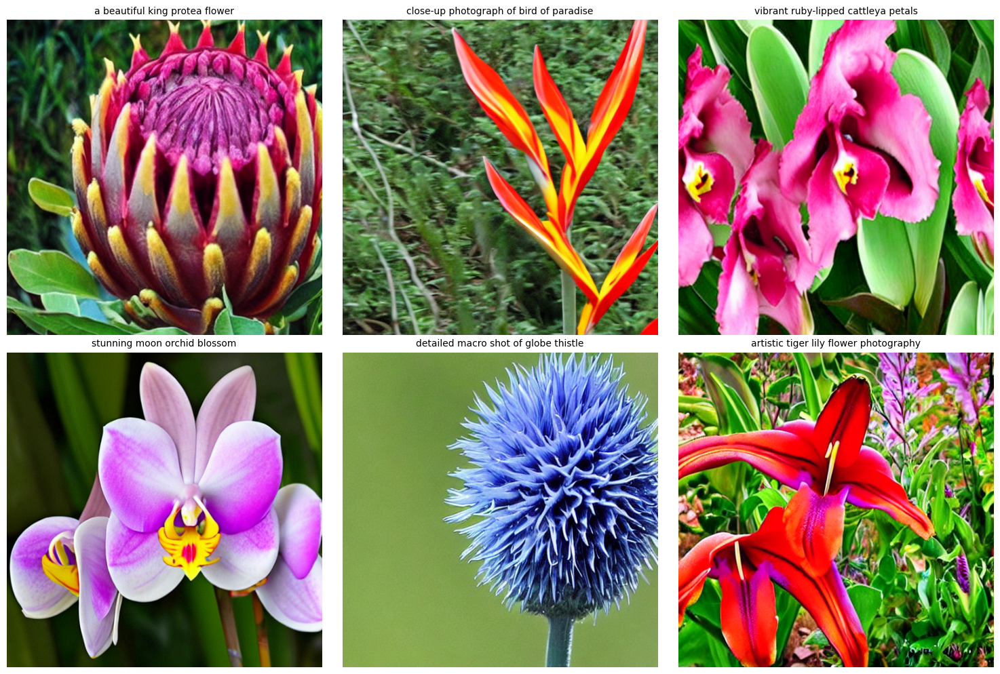

In [12]:
def test_generation():
    device = setup_device()[0]
    
    # Load base pipeline
    pipe = StableDiffusionPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        torch_dtype=torch.float32,
        safety_checker=None,
        requires_safety_checker=False
    ).to(device)
    
    # Load LoRA weights
    pipe.unet = load_lora_wt(pipe.unet, "./models/lora_flower_model/lora_weights_final.pt")

    # Test with flower prompts
    test_prompts = [
        "a beautiful king protea flower",
        "close-up photograph of bird of paradise",
        "vibrant ruby-lipped cattleya petals", 
        "stunning moon orchid blossom",
        "detailed macro shot of globe thistle",
        "artistic tiger lily flower photography"
    ]
    
    # Create subplot grid for inline display
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, prompt in enumerate(test_prompts):
        print(f"Generating: {prompt}")
        
        # Generate image
        image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]
        
        # Save image
        flower_name = prompt.split()[-2] if len(prompt.split()) > 2 else f"flower_{i}"
        image.save(f"generated_{i}_{flower_name}.png")
        
        # Display inline
        axes[i].imshow(image)
        axes[i].set_title(prompt, fontsize=10, wrap=True)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

test_generation()

In [13]:
def create_comparison_image(img1, img2, prompt, img_size=(512, 512)):
    """Create simple side-by-side comparison with just the prompt caption"""
    from PIL import Image, ImageDraw, ImageFont
    
    # Resize images to consistent size
    img1 = img1.resize(img_size)
    img2 = img2.resize(img_size)
    
    # Create canvas (images side by side + space for caption)
    canvas_width = img_size[0] * 2 + 20  # 20px gap between images
    canvas_height = img_size[1] + 50     # 50px for caption
    canvas = Image.new('RGB', (canvas_width, canvas_height), 'white')
    
    # Paste images side by side
    canvas.paste(img1, (0, 0))
    canvas.paste(img2, (img_size[0] + 20, 0))
    
    # Add prompt caption at bottom
    draw = ImageDraw.Draw(canvas)
    try:
        font = ImageFont.truetype("arial.ttf", 14)
    except:
        font = ImageFont.load_default()
    
    # Center the prompt text
    prompt_text = prompt[:100] + "..." if len(prompt) > 100 else prompt
    text_bbox = draw.textbbox((0, 0), prompt_text, font=font)
    text_width = text_bbox[2] - text_bbox[0]
    
    draw.text(
        ((canvas_width - text_width) // 2, img_size[1] + 15), 
        prompt_text, 
        fill='black', 
        font=font
    )
    
    return canvas

In [14]:
def comparative_test_oxford102(
    lora_weights_path,
    output_dir='./outputs',
    test_prompts=None,
    num_inference_steps=50,
    guidance_scale=7.5,
    seed=42
):
    import matplotlib.pyplot as plt
    """
    Compare original SD1.5 vs LoRA fine-tuned model side-by-side
    
    Args:
        lora_weights_path: Path to saved LoRA weights
        output_dir: Directory to save comparison images
        test_prompts: List of prompts to test (uses Oxford 102 defaults if None)
        num_inference_steps: Number of denoising steps
        guidance_scale: CFG scale
        seed: Random seed for reproducible results
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    os.makedirs(output_dir, exist_ok=True)
    
    # Default Oxford 102 test prompts (mix of common and rare species)
    if test_prompts is None:
        test_prompts = [
            # Well-known flowers (baseline comparison)
            "a beautiful red rose in full bloom",
            "vibrant sunflower petals",
            "delicate white water lily",
            
            # Oxford 102 specific species (should show improvement)
            "stunning king protea flower",
            "close-up photograph of bird of paradise",
            "ruby-lipped cattleya orchid",
            "globe thistle with spiky purple blooms",
            "moon orchid with white petals",
            "hard-leaved pocket orchid",
            "prince of wales feathers flower",
            "giant white arum lily",
            "stemless gentian blue flower",
            
            # Complex compositions (test generalization)
            "artistic macro shot of tiger lily",
            "botanical photograph of fritillary flower",
            "garden scene with canterbury bells"
        ]
    
    print(f"🌸 Starting comparative test with {len(test_prompts)} prompts...")
    print(f"Device: {device}")
    print(f"Output directory: {output_dir}")
    
    # ============ Load Original SD1.5 Pipeline ============
    print("\n📥 Loading original SD1.5 model...")
    original_pipe = StableDiffusionPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        torch_dtype=torch.float32,
        safety_checker=None,  # Disable for faster inference
        requires_safety_checker=False
    ).to(device)
    
    # ============ Load LoRA Fine-tuned Pipeline ============
    print("📥 Loading LoRA fine-tuned model...")
    lora_pipe = StableDiffusionPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        torch_dtype=torch.float32,
        safety_checker=None,
        requires_safety_checker=False
    ).to(device)
    
    # Apply LoRA weights
    lora_pipe.unet = load_lora_wt(lora_pipe.unet, lora_weights_path)
    print(f"✅ LoRA weights loaded from: {lora_weights_path}")
    
    # ============ Generate Comparison Images ============
    
    for i, prompt in enumerate(test_prompts):
        print(f"\n🎨 [{i+1}/{len(test_prompts)}] Generating: '{prompt}'")
        
        # Set same seed for both models for fair comparison
        generator_orig = torch.Generator(device=device).manual_seed(seed + i)
        generator_lora = torch.Generator(device=device).manual_seed(seed + i)
        
        try:
            # Generate with original model
            print("   🔸 Original SD1.5...")
            original_image = original_pipe(
                prompt, 
                num_inference_steps=num_inference_steps,
                guidance_scale=guidance_scale,
                generator=generator_orig
            ).images[0]
            
            # Generate with LoRA model  
            print("   🔸 LoRA fine-tuned...")
            lora_image = lora_pipe(
                prompt,
                num_inference_steps=num_inference_steps, 
                guidance_scale=guidance_scale,
                generator=generator_lora
            ).images[0]
            
            # Create side-by-side comparison
            comparison_img = create_comparison_image(original_image, lora_image, prompt)
            
            # Display in notebook
            plt.figure(figsize=(12, 6))
            plt.imshow(comparison_img)
            plt.axis('off')
            plt.title(f"Comparison {i+1}")
            plt.show()
            
            # Save individual images
            safe_filename = prompt.replace(" ", "_").replace(",", "")[:50]
            original_image.save(f"{output_dir}/original_{i:02d}_{safe_filename}.png")
            lora_image.save(f"{output_dir}/lora_{i:02d}_{safe_filename}.png")
            comparison_img.save(f"{output_dir}/comparison_{i:02d}_{safe_filename}.png")
            
        except Exception as e:
            print(f"   ❌ Error generating '{prompt}': {e}")
            continue

🌸 Starting comparative test with 15 prompts...
Device: cuda
Output directory: ./outputs

📥 Loading original SD1.5 model...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

📥 Loading LoRA fine-tuned model...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

✅ LoRA weights loaded from: ./models/lora_flower_model/lora_weights_final.pt

🎨 [1/15] Generating: 'a beautiful red rose in full bloom'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

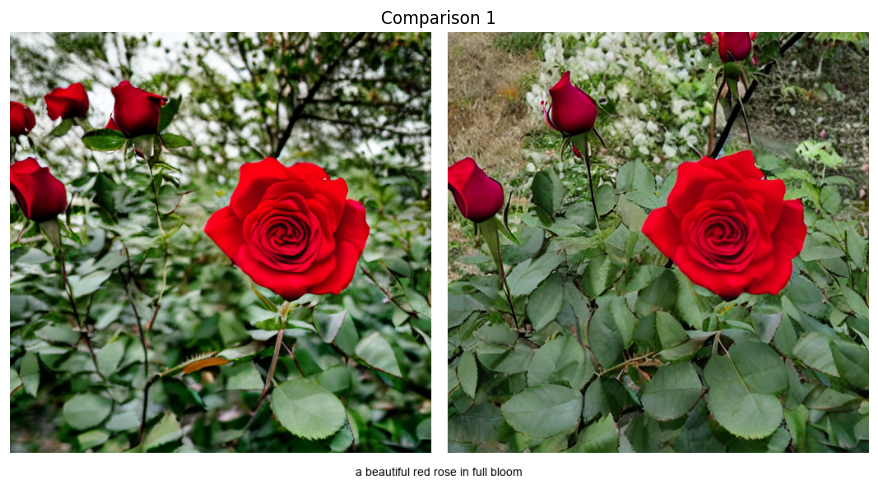


🎨 [2/15] Generating: 'vibrant sunflower petals'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

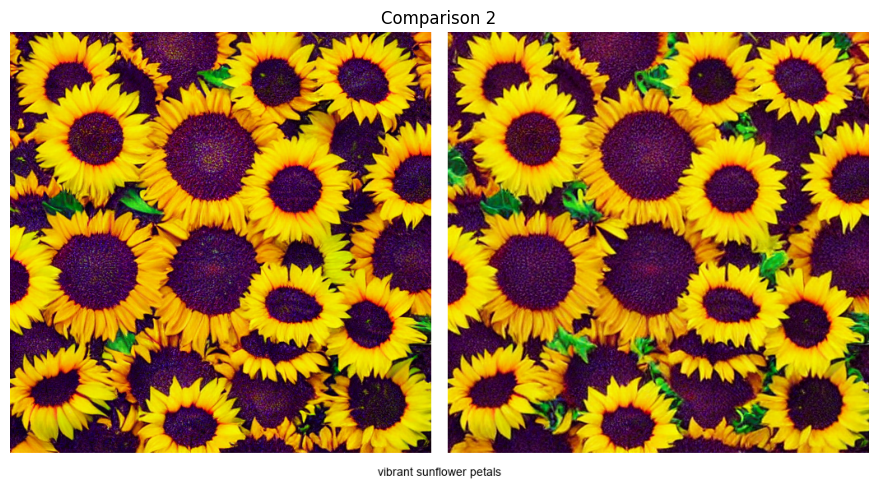


🎨 [3/15] Generating: 'delicate white water lily'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

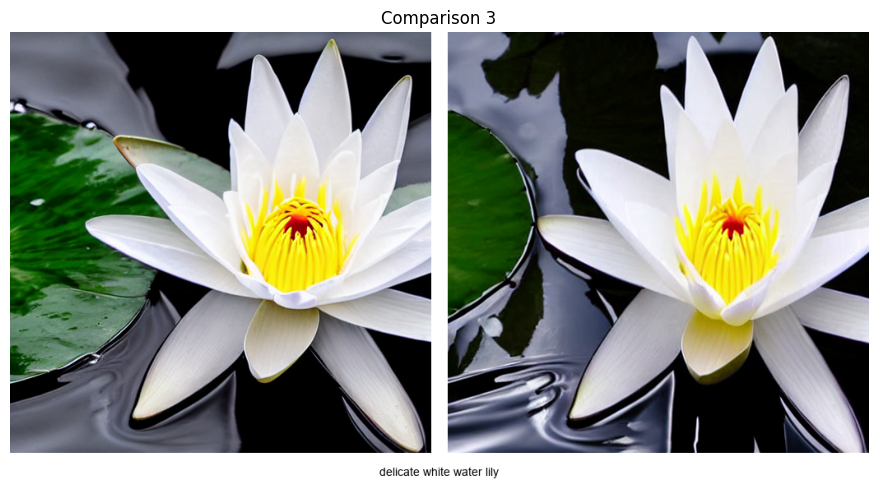


🎨 [4/15] Generating: 'stunning king protea flower'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

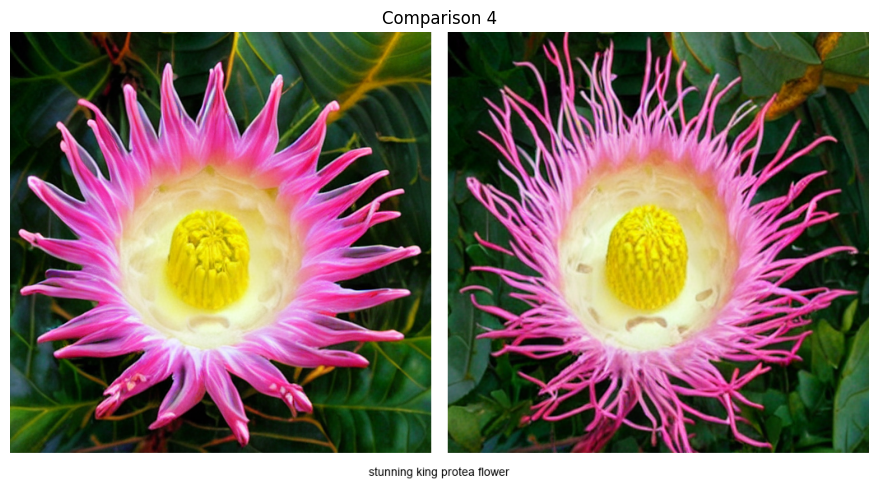


🎨 [5/15] Generating: 'close-up photograph of bird of paradise'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

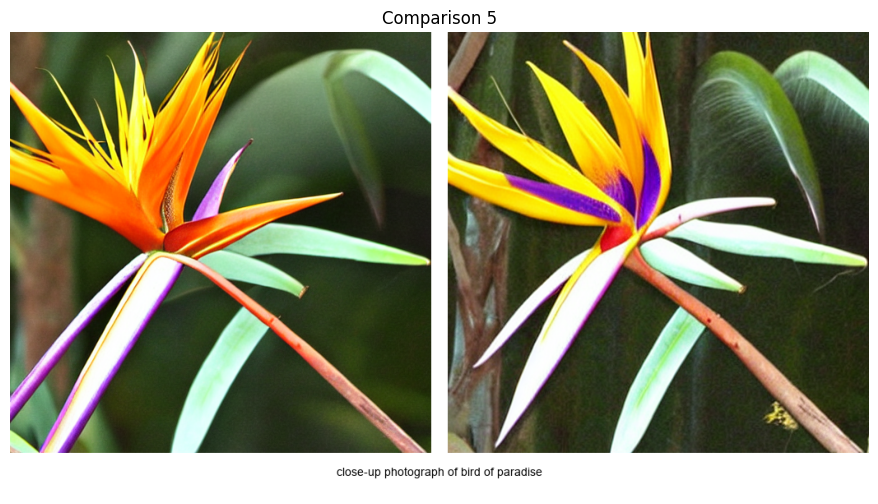


🎨 [6/15] Generating: 'ruby-lipped cattleya orchid'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

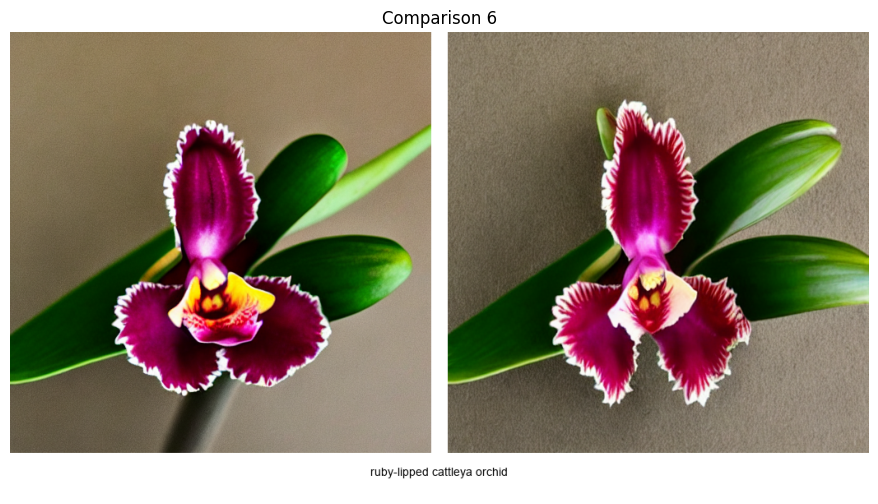


🎨 [7/15] Generating: 'globe thistle with spiky purple blooms'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

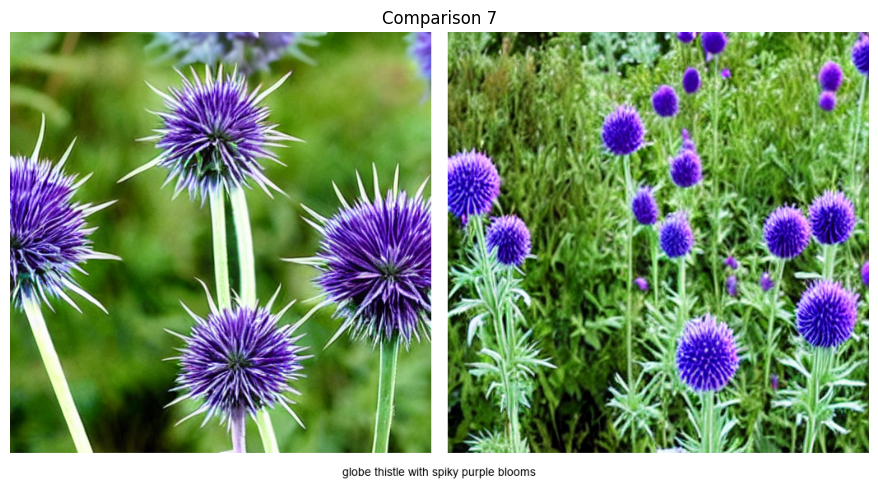


🎨 [8/15] Generating: 'moon orchid with white petals'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

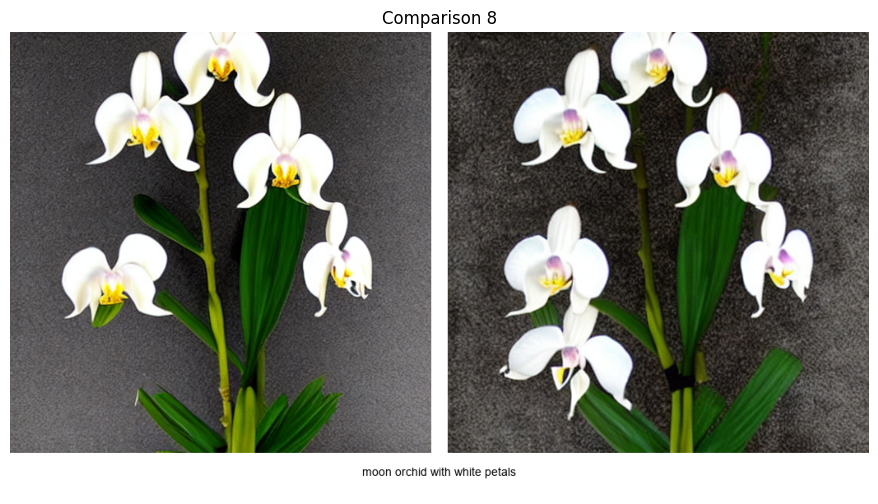


🎨 [9/15] Generating: 'hard-leaved pocket orchid'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

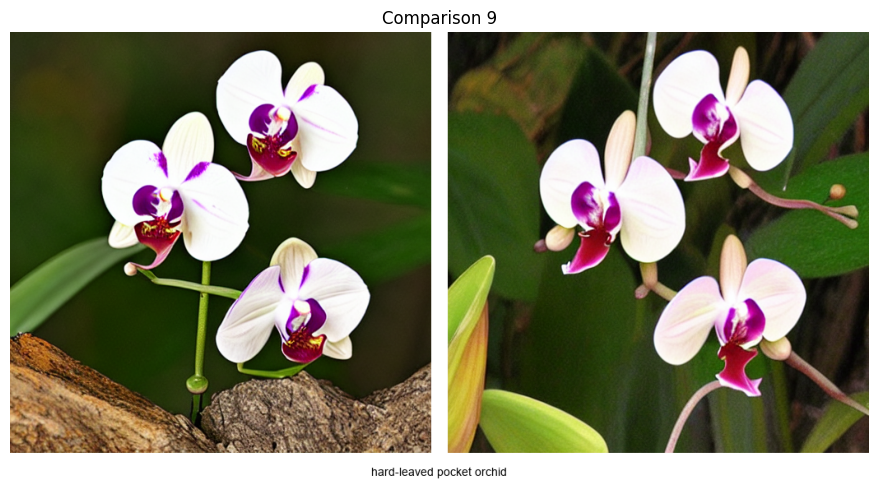


🎨 [10/15] Generating: 'prince of wales feathers flower'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

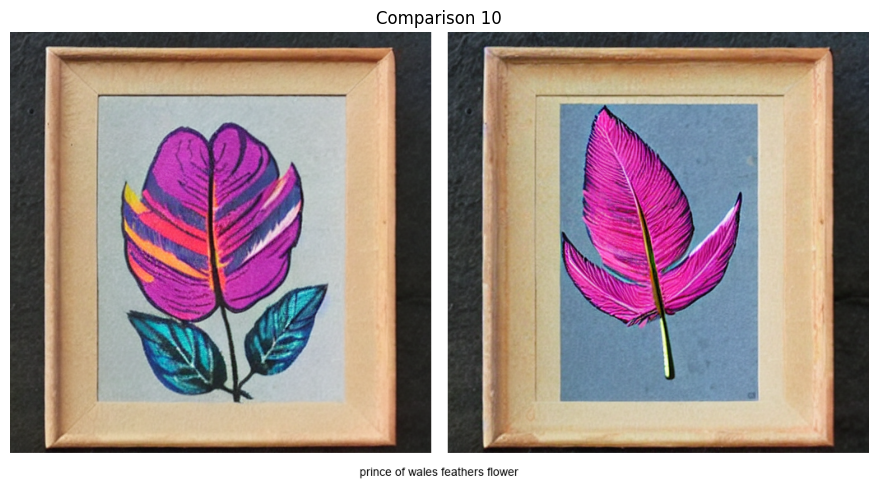


🎨 [11/15] Generating: 'giant white arum lily'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

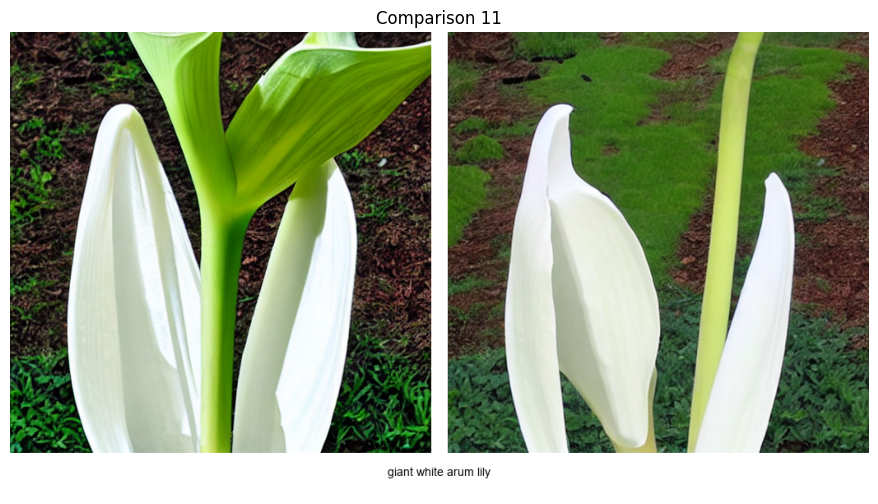


🎨 [12/15] Generating: 'stemless gentian blue flower'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

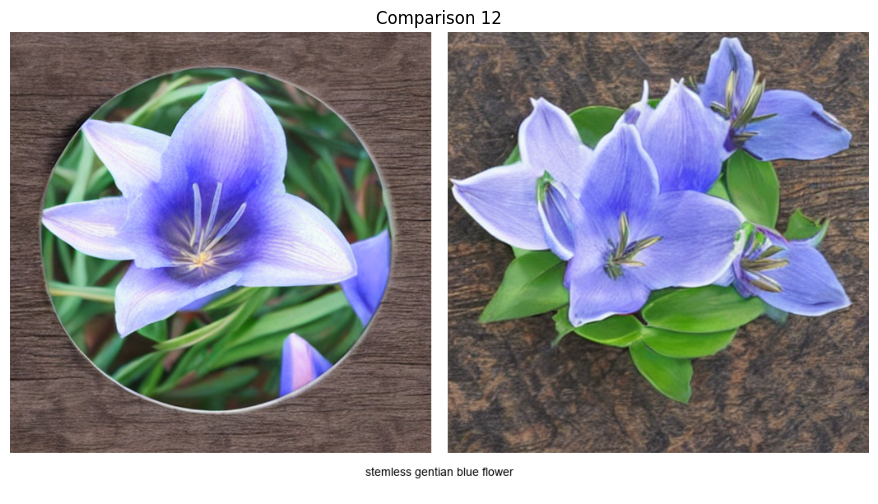


🎨 [13/15] Generating: 'artistic macro shot of tiger lily'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

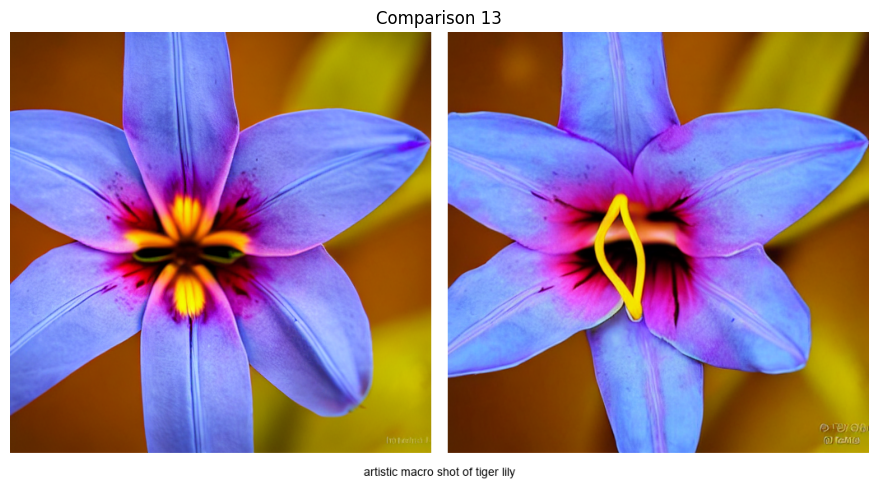


🎨 [14/15] Generating: 'botanical photograph of fritillary flower'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

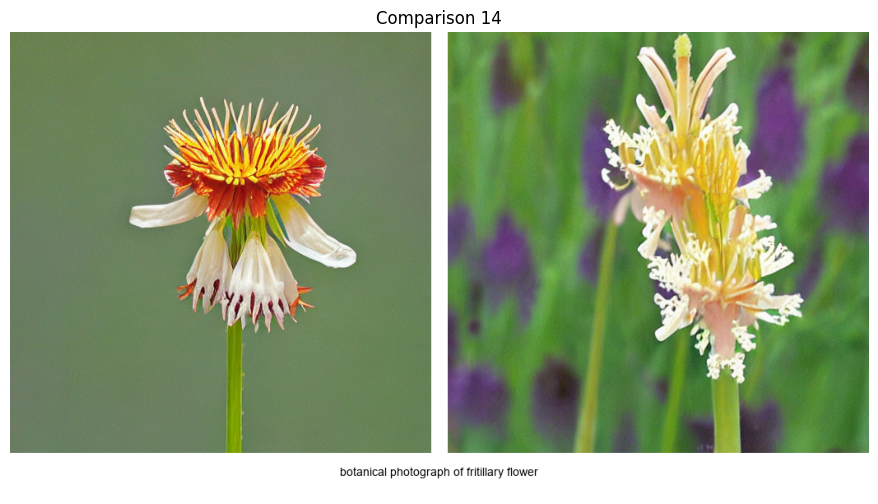


🎨 [15/15] Generating: 'garden scene with canterbury bells'
   🔸 Original SD1.5...


  0%|          | 0/50 [00:00<?, ?it/s]

   🔸 LoRA fine-tuned...


  0%|          | 0/50 [00:00<?, ?it/s]

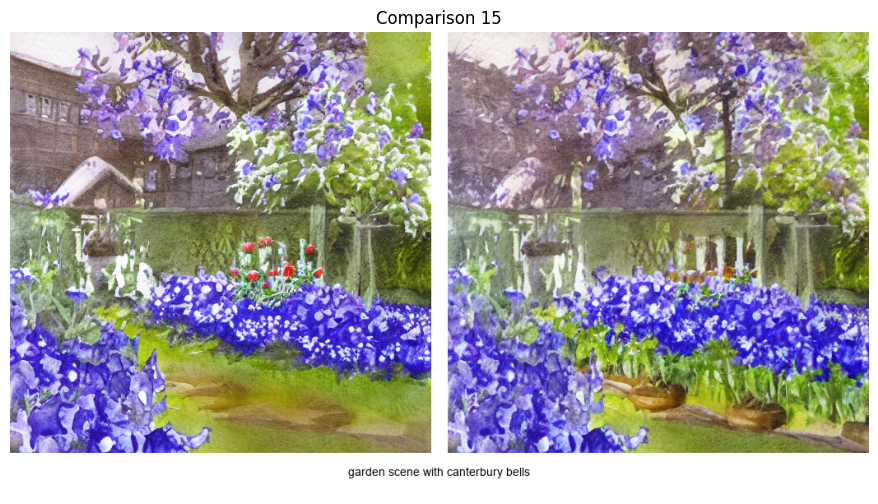

In [16]:
comparative_test_oxford102(
        lora_weights_path="./models/lora_flower_model/lora_weights_final.pt",
        output_dir='./outputs',
        seed=747
    )

## Or Use HuggingFace diffusers to train
```bash
accelerate launch train_text_to_image_lora.py
        --pretrained_model_name_or_path="runwayml/stable-diffusion-v1-5"
        --dataset_name="./hf_flower_dataset"
        --caption_column="text"
        --image_column="image"
        --resolution=512
        --train_batch_size=4
        --gradient_accumulation_steps=2
        --max_train_steps=2000   
        --learning_rate=1e-4
        --max_grad_norm=1
        --lr_scheduler="cosine"
        --lr_warmup_steps=100
        --output_dir="./lora-flower-model"
        --rank=16   --validation_prompt="a beautiful sunflower flower"
        --validation_epochs=5
```

In [17]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial

In [26]:
clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

test_prompts = [
            # Well-known flowers (baseline comparison)
            "a beautiful red rose in full bloom",
            "vibrant sunflower petals",
            "delicate white water lily",
            
            # Oxford 102 specific species (should show improvement)
            "stunning king protea flower",
            "close-up photograph of bird of paradise",
            "ruby-lipped cattleya orchid",
            "globe thistle with spiky purple blooms",
            "moon orchid with white petals",
            "hard-leaved pocket orchid",
            "prince of wales feathers flower",
            "giant white arum lily",
            "stemless gentian blue flower",
            
            # Complex compositions (test generalization)
            "artistic macro shot of tiger lily",
            "botanical photograph of fritillary flower",
            "garden scene with canterbury bells"
        ]

def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

lora_pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float32,
    safety_checker=None,
    requires_safety_checker=False
).to('cuda:0')
    
# Apply LoRA weights
lora_pipe.unet = load_lora_wt(lora_pipe.unet, "./models/lora_flower_model/lora_weights_final.pt")
images = lora_pipe(test_prompts,
                   num_inference_steps=25,
                   guidance_scale=7.5,
                   generator=torch.Generator(device='cuda:0').manual_seed(747),
                   num_images_per_prompt=1, 
                   output_type="np").images   


lora_clip_score = calculate_clip_score(images, test_prompts)
print(f"CLIP score: {lora_clip_score}")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

CLIP score: 31.4555
